Load the packages

In [1]:
# Disable warnings in the notebook to maintain clean output cells
import warnings
warnings.filterwarnings('ignore')

# Import necessary libraries
import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

Load Yolo V11 nano model

In [2]:
 model = YOLO('yolo11n.pt')

Checking pretrained model


image 1/1 /Users/shubham/Documents/ECEN642_final_project/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 cars, 52.0ms
Speed: 3.7ms preprocess, 52.0ms inference, 6.2ms postprocess per image at shape (1, 3, 384, 640)


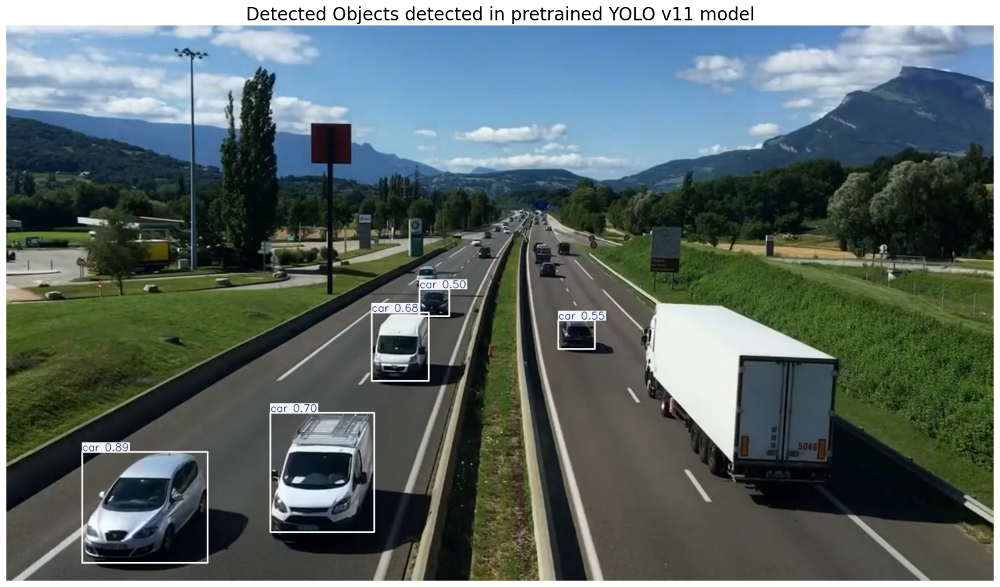

In [3]:
# Path to the image file
image_path = './Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image(s)
results = model.predict(source=image_path, imgsz=640,   conf=0.5)  

# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects detected in pretrained YOLO v11 model', fontsize=20)
plt.axis('off')
plt.show()

Fine-tuning Yolo

In [4]:
# Define the dataset_path
dataset_path = './Vehicle_Detection_Image_Dataset'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



In [6]:
# Set paths for training and validation image sets
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# Initialize counters for the number of images
num_train_images = 0
num_valid_images = 0

# Initialize sets to hold the unique sizes of images
train_image_sizes = set()
valid_image_sizes = set()

# Check train images sizes and count
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):  
        num_train_images += 1
        image_path = os.path.join(train_images_path, filename)
        with Image.open(image_path) as img:
            train_image_sizes.add(img.size)

# Check validation images sizes and count
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'): 
        num_valid_images += 1
        image_path = os.path.join(valid_images_path, filename)
        with Image.open(image_path) as img:
            valid_image_sizes.add(img.size)

# Print the results
print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")

# Check if all images in training set have the same size
if len(train_image_sizes) == 1:
    print(f"All training images have the same size: {train_image_sizes.pop()}")
else:
    print("Training images have varying sizes.")

# Check if all images in validation set have the same size
if len(valid_image_sizes) == 1:
    print(f"All validation images have the same size: {valid_image_sizes.pop()}")
else:
    print("Validation images have varying sizes.")

Number of training images: 536
Number of validation images: 90
All training images have the same size: (640, 640)
All validation images have the same size: (640, 640)


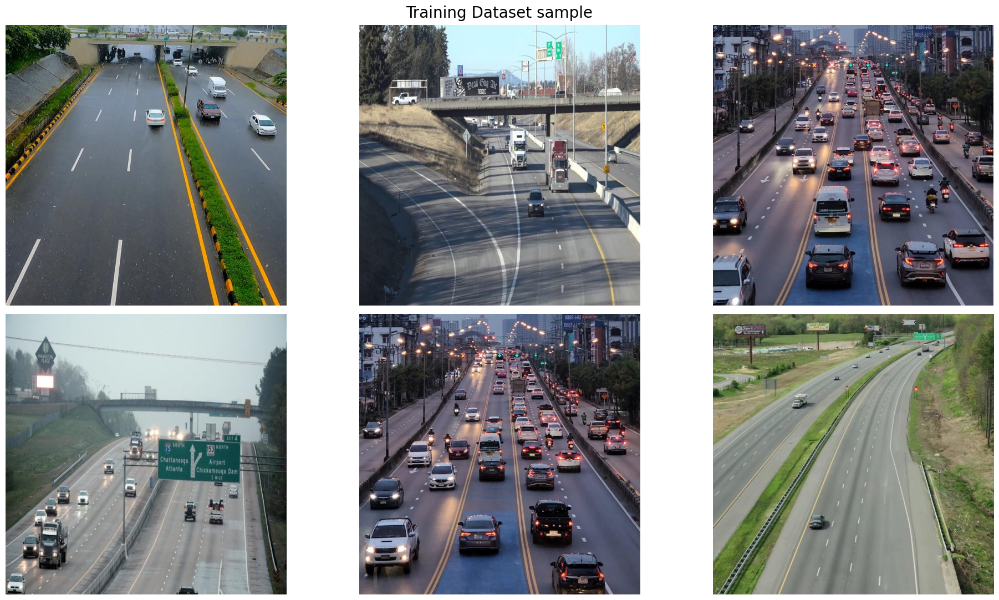

In [9]:
# List all jpg images in the directory
image_files = [file for file in os.listdir(train_images_path) if file.endswith('.jpg')]

# Select 8 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Create a 2x4 subplot
fig, axes = plt.subplots(2, 3, figsize=(20, 11))

# Display each of the selected images
for ax, img_file in zip(axes.ravel(), selected_images):
    img_path = os.path.join(train_images_path, img_file)
    image = Image.open(img_path)
    ax.imshow(image)
    ax.axis('off')  

plt.suptitle('Training Dataset sample', fontsize=20)
plt.tight_layout()
plt.show()

Fine tuning parameters

Clear Cache

In [10]:
import torch

torch.mps.empty_cache()


In [8]:
# Train the model on our custom dataset
results = model.train(
    data='/Users/shubham/Documents/ECEN642/Vehicle_Detection_Image_Dataset/data.yaml',     # Path to the dataset configuration file
    epochs=20,              # Number of epochs to train for
    imgsz=640,               # Size of input images as integer
    device='mps',                # Device to run on, i.e. cuda device=0 
    patience=50,             # Epochs to wait for no observable improvement for early stopping of training
    batch=32,                # Number of images per batch
    optimizer='auto',        # Optimizer to use, choices=[SGD, Adam, Adamax, AdamW, NAdam, RAdam, RMSProp, auto]
    lr0=0.0001,              # Initial learning rate 
    lrf=0.1,                 # Final learning rate (lr0 * lrf)
    dropout=0.1,             # Use dropout regularization
    seed=0,                   # Random seed for reproducibility
    cache=False
)

New https://pypi.org/project/ultralytics/8.3.101 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.99 🚀 Python-3.9.6 torch-2.6.0 MPS (Apple M4)
engine/trainer: task=detect, mode=train, model=yolov8n.pt, data=/Users/shubham/Documents/ECEN642/Vehicle_Detection_Image_Dataset/data.yaml, epochs=20, time=None, patience=50, batch=32, imgsz=640, save=True, save_period=-1, cache=False, device=mps, workers=8, project=None, name=train8, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.1, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=Non

KeyboardInterrupt: 

Validation set

In [11]:
# Define the path to the directory
post_training_files_path = './runs/detect/train_50_epochs_yolov11'

# List the files in the directory
!ls {post_training_files_path}

F1_curve.png                    train_batch2.jpg
PR_curve.png                    train_batch340.jpg
P_curve.png                     train_batch341.jpg
R_curve.png                     train_batch342.jpg
args.yaml                       train_batch680.jpg
confusion_matrix.png            train_batch681.jpg
confusion_matrix_normalized.png train_batch682.jpg
labels.jpg                      val_batch0_labels.jpg
labels_correlogram.jpg          val_batch0_pred.jpg
results.csv                     val_batch1_labels.jpg
results.png                     val_batch1_pred.jpg
train_batch0.jpg                weights
train_batch1.jpg


In [12]:
# Define a function to plot learning curves for loss values
def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12, 5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train Loss', color='#141140', linestyle='-', linewidth=2)
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation Loss', color='orangered', linestyle='--', linewidth=2)
    plt.title(title)
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

Performance Evaluation

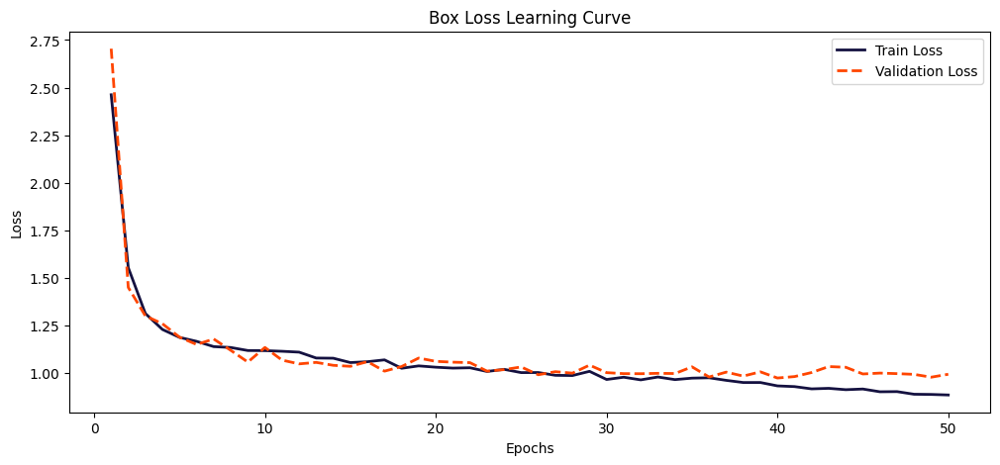

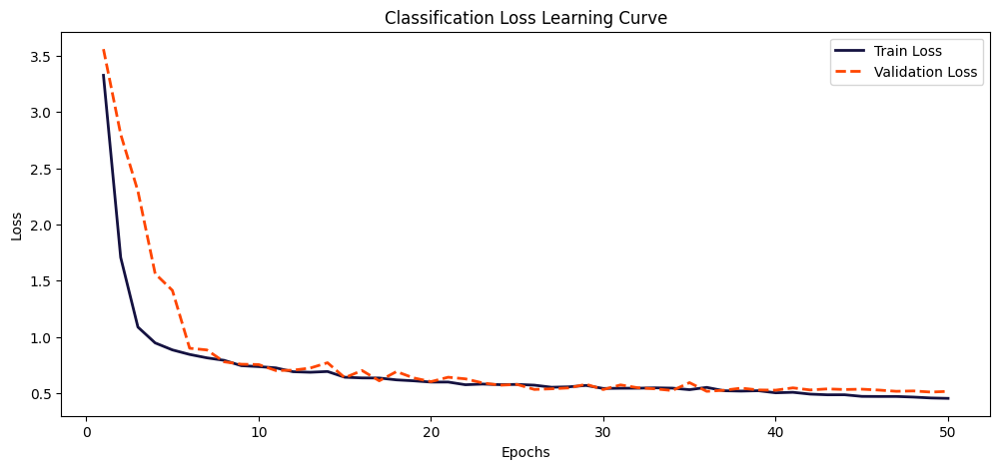

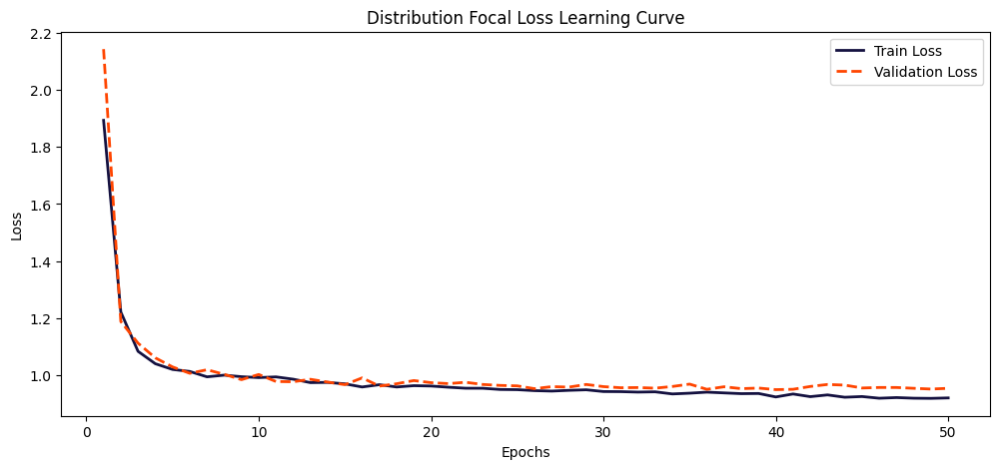

In [ ]:

results_csv_path = os.path.join(post_training_files_path, 'results.csv')

# Load the CSV file from the constructed path into a pandas DataFrame
df = pd.read_csv(results_csv_path)

# Remove any leading whitespace from the column names
df.columns = df.columns.str.strip()

# Plot the learning curves for each loss
plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss Learning Curve')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Classification Loss Learning Curve')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'Distribution Focal Loss Learning Curve')

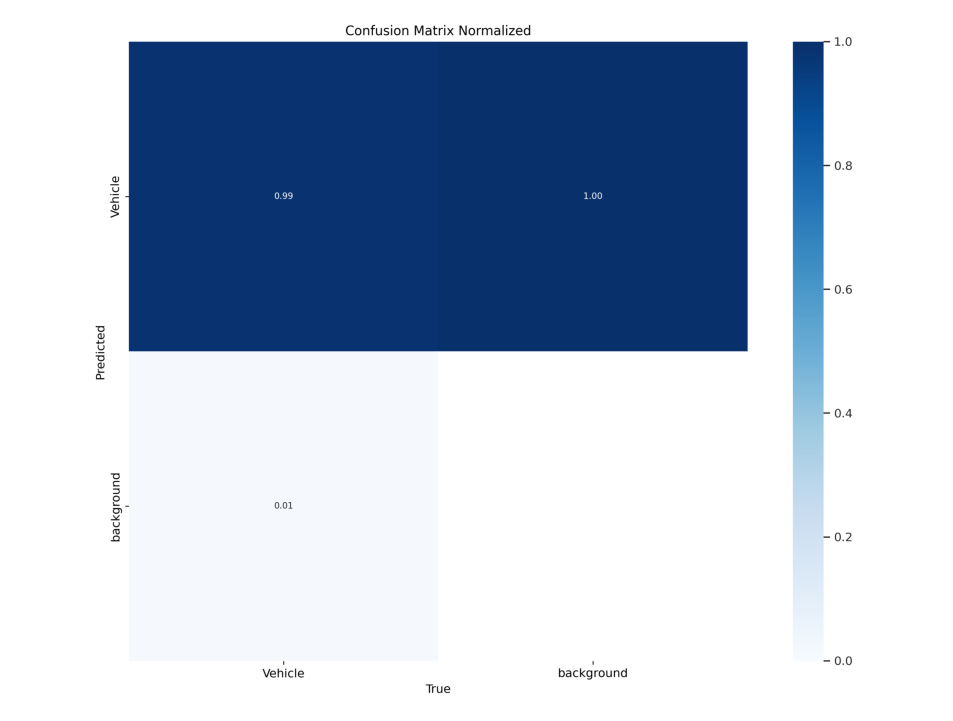

In [14]:
# Construct the path to the normalized confusion matrix image
confusion_matrix_path = os.path.join(post_training_files_path, 'confusion_matrix_normalized.png')

# Read the image using cv2
cm_img = cv2.imread(confusion_matrix_path)

# Convert the image from BGR to RGB color space for accurate color representation with matplotlib
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)

# Display the image
plt.figure(figsize=(10, 10), dpi=120)
plt.imshow(cm_img)
plt.axis('off') 
plt.show()

Load Best model

In [ ]:

best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')

# Load the best model weights into the YOLO model
best_model = YOLO(best_model_path)

# Validate the best model using the validation set with default parameters
#metrics = best_model.val(split='val')

Sample Inference on Validation data


image 1/1 /Users/shubham/Documents/ECEN642_final_project/Vehicle_Detection_Image_Dataset/valid/images/14_mp4-24_jpg.rf.57d5fe50d543f58e3b1f761ee53e1aa8.jpg: 640x640 7 Vehicles, 53.1ms
Speed: 1.2ms preprocess, 53.1ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/shubham/Documents/ECEN642_final_project/Vehicle_Detection_Image_Dataset/valid/images/2_mp4-10_jpg.rf.97b46cb44bcae5057b47db4ebbbe9305.jpg: 640x640 4 Vehicles, 46.9ms
Speed: 0.6ms preprocess, 46.9ms inference, 0.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/shubham/Documents/ECEN642_final_project/Vehicle_Detection_Image_Dataset/valid/images/3_mp4-8_jpg.rf.4a784fedfdd385032614371ea5cb78fa.jpg: 640x640 2 Vehicles, 41.9ms
Speed: 0.9ms preprocess, 41.9ms inference, 0.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /Users/shubham/Documents/ECEN642_final_project/Vehicle_Detection_Image_Dataset/valid/images/test2_mp4-21_jpg.rf.bbb3ba4e4b69e5a12822300829bf75f0.j

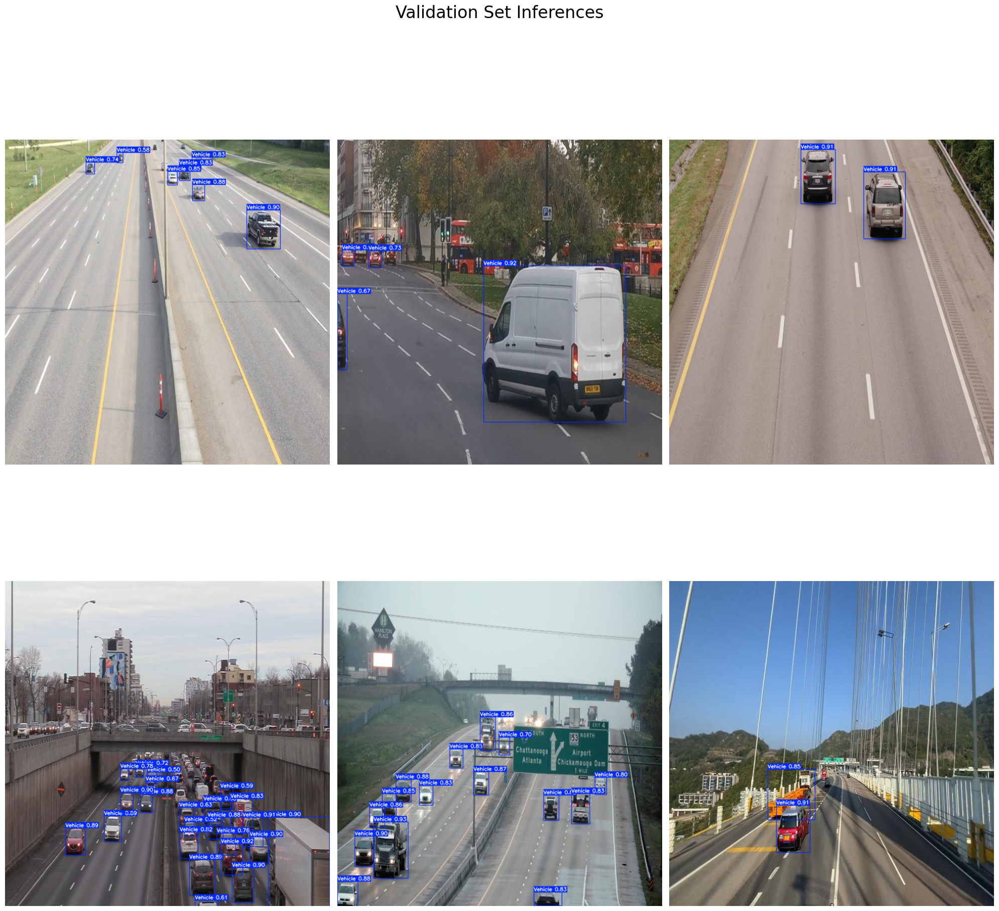

In [20]:
# Define the path to the validation images
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

# List all jpg images in the directory
image_files = [file for file in os.listdir(valid_images_path) if file.endswith('.jpg')]

# Select 9 images at equal intervals
num_images = len(image_files)
selected_images = [image_files[i] for i in range(0, num_images, num_images // 8)]

# Initialize the subplot
fig, axes = plt.subplots(2, 3, figsize=(20, 21))
fig.suptitle('Validation Set Inferences', fontsize=24)

# Perform inference on each selected image and display it
for i, ax in enumerate(axes.flatten()):
    image_path = os.path.join(valid_images_path, selected_images[i])
    results = best_model.predict(source=image_path, imgsz=640, conf=0.5)
    annotated_image = results[0].plot(line_width=1)
    annotated_image_rgb = cv2.cvtColor(annotated_image, cv2.COLOR_BGR2RGB)
    ax.imshow(annotated_image_rgb)
    ax.axis('off')

plt.tight_layout()
plt.show()

Check Fine-tuned YOLO model


image 1/1 /Users/shubham/Documents/ECEN642_final_project/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 Vehicles, 34.1ms
Speed: 1.8ms preprocess, 34.1ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


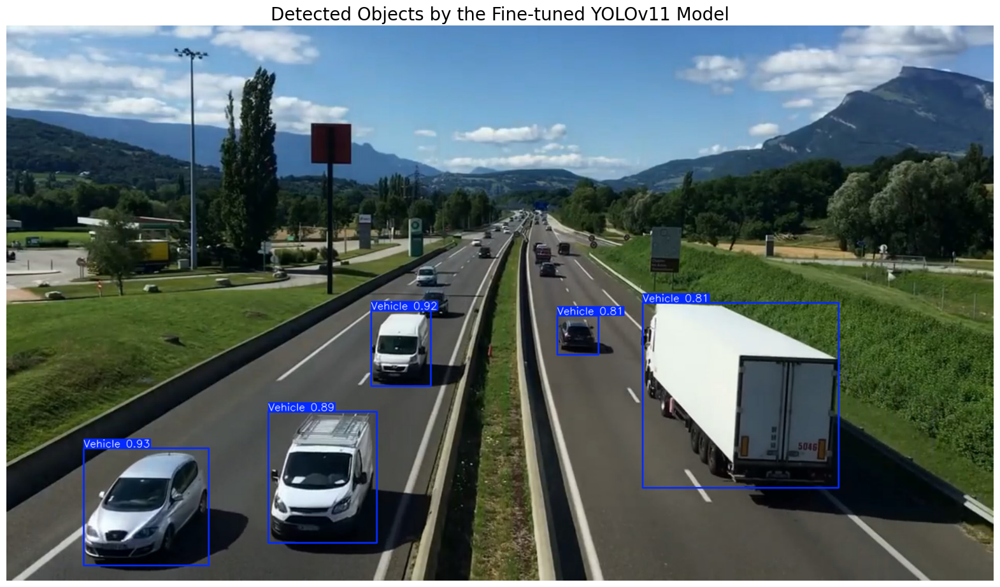

In [21]:
# Path to the image file
sample_image_path = './Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference on the provided image using best model
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7) 
                        
# Annotate and convert image to numpy array
sample_image = results[0].plot(line_width=2)

# Convert the color of the image from BGR to RGB for correct color representation in matplotlib
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display annotated image
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title('Detected Objects by the Fine-tuned YOLOv11 Model', fontsize=20)
plt.axis('off')
plt.show()

In [16]:
# Define the path to the sample video in the dataset
dataset_video_path = './Vehicle_Detection_Image_Dataset/sample_video.mp4'

# Define the destination path in the working directory
video_path = './output/sample_video.mp4'

# Copy the video file from its original location in the dataset to the current working directory in Kaggle for further processing
#shutil.copyfile(dataset_video_path, video_path)

# Initiate vehicle detection on the sample video using the best performing model and save the output
best_model.predict(source=dataset_video_path, save=True)



WARNING ⚠️ inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /Users/shubham/Documents/ECEN642/Vehicle_Detection_Image_Dataset/sample_video.mp4: 384x640 3 Vehicles, 25.9ms
video 1/1 (frame 2/601) /Users/shubham/Documents/ECEN642/Vehicle_Detection_Image_Dataset/sample_video.mp4: 384x640 3 Vehicles, 23.4ms
video 1/1 (frame 3/601) /Users/shubham/Documents/ECEN642/Vehicle_Detection_Image_Dataset/sample_video.mp4: 384x640 3 Vehicles, 23.5ms
video 1/1 (frame 4/601) /Users/shubham/Documents/ECEN6

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[251, 246, 242],
         [251, 246, 242],
         [251, 246, 242],
         ...,
         [210, 185, 165],
         [210, 185, 165],
         [210, 185, 165]],
 
        [[251, 246, 242],
         [251, 246, 242],
         [251, 246, 242],
         ...,
         [210, 185, 165],
         [210, 185, 165],
         [210, 185, 165]],
 
        [[253, 246, 240],
         [253, 246, 240],
         [253, 246, 240],
         ...,
         [210, 185, 165],
         [210, 185, 165],
         [210, 185, 165]],
 
        ...,
 
        [[ 94, 104, 102],
         [ 96, 107, 104],
         [101, 111, 109],
         ...,
         [ 94, 105, 110],
         [ 95, 107, 111],
         [ 97, 109, 113]],
 
        [[ 97, 108, 105],
         [103, 113, 111],
         [100, 110, 108],
         ...,
         [ 95, 10

In [ ]:

# Embed and display the processed sample video within the notebook
Video("runs/detect/predict4/sample_video.mp4", embed=True, width=960)

Get the fps of video

In [18]:
# Define the path to the video file
video_path = 'Vehicle_Detection_Image_Dataset/sample_video.mp4'

# Open the video file
cap = cv2.VideoCapture(video_path)

# Get the frames per second (FPS) of the video
fps = cap.get(cv2.CAP_PROP_FPS)

# Print the FPS
print(f"Frames per second (FPS): {fps}")

# Release the video capture object
cap.release()

Frames per second (FPS): 30.0


Get pixel position of an image

In [ ]:
# Define a callback function to capture mouse click events
def get_pixel_coordinates(event, x, y, flags, param):
    if event == cv2.EVENT_LBUTTONDOWN:  # Left mouse button click
        print(f"Pixel coordinates: ({x}, {y})")

# Load the image
image_path = './Vehicle_Detection_Image_Dataset/sample_image.jpg'
image = cv2.imread(image_path)

# Display the image in a window
cv2.imshow('Image', image)

# Set the mouse callback function
cv2.setMouseCallback('Image', get_pixel_coordinates)

# Wait until a key is pressed, then close the window
cv2.waitKey(0)
cv2.destroyAllWindows()

Pixel coordinates: (965, 530)
Pixel coordinates: (915, 532)
Pixel coordinates: (926, 1057)
Pixel coordinates: (1026, 539)


: 

Proceed to object_tracking.ipynb for oject tracking and speed estimation

****************************** ALL THE CODES BELOW ARE FOR TESTING VARIOUS OTHER OBJECT DETECTION MODELS. PLEASE IGNORE *****************

Object tracking Deep SORT

In [ ]:
import cv2
from ultralytics import YOLO
import imutils
from deep_sort_realtime.deepsort_tracker import DeepSort

# Load the fine-tuned YOLO model
model = best_model#YOLO(fine_tuned_model)

object_tracker = DeepSort(max_age=30
                          , n_init=3
                          , nn_budget=None
                          , max_cosine_distance=0.2
                          ,max_iou_distance=0.7
                          ,nms_max_overlap=1.0
                          ,embedder='mobilenet'
                          ,gating_only_position=False
                          ,override_track_class=None
                          ,half=True
                          ,embedder_gpu=False
                          ,embedder_model_name=None
                          ,embedder_wts=None
                          ,polygon=False
                          ,today=None)

def get_details(result,image):
    classes = result[0].boxes.cls.numpy()
    conf = result[0].boxes.conf.numpy()
    xywh = result[0].boxes.xywh.numpy()

    detections = []
    for i,item in enumerate(xywh):
        sample = (item,conf[i],classes[i])
        detections.append(sample)
    return detections



# Open the sample video
video_path = './Vehicle_Detection_Image_Dataset/sample_video.mp4'
cap = cv2.VideoCapture(video_path)

# Check if the video capture is opened successfully
if not cap.isOpened():
    print("Error: Unable to open the video.")
    exit()

# Get video properties
fps = int(cap.get(cv2.CAP_PROP_FPS))
width = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH))
height = int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))

# Initialize video writer to save the output
output_path = 'sample_video_inference.avi'
video_writer = cv2.VideoWriter(output_path, cv2.VideoWriter_fourcc(*'XVID'), fps, (width, height))


# Perform inference on the video
while True:
    ret, frame = cap.read()
    if not ret:
        print("End of video or unable to read frame.")
        break

    # Perform inference on the current frame
    results = model.predict(source=frame, imgsz=640, conf=0.5)

    details = get_details(results,frame)
    tracks = object_tracker.update_tracks(details, frame=frame)
    for track in tracks:
        bbox = track.to_ltrb()
        track_id = track.track_id

        cv2.putText(frame, f"ID: {track_id}", (int(bbox[0]), int(bbox[1])), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)
        
    # Annotate the frame with detection results
    #annotated_frame = results[0].plot(line_width=2)

    # Write the annotated frame to the output video
    #video_writer.write(annotated_frame)

    # Display the annotated frame (optional)
    cv2.imshow("Video Inference", frame)

    # Break the loop if 'q' is pressed
    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

# Release resources
cap.release()
video_writer.release()
cv2.destroyAllWindows()

print(f"Inference completed. Output saved to {output_path}")


0: 384x640 1 Vehicle, 28.7ms
Speed: 1.1ms preprocess, 28.7ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Vehicle, 30.6ms
Speed: 0.9ms preprocess, 30.6ms inference, 0.3ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Vehicle, 33.1ms
Speed: 1.1ms preprocess, 33.1ms inference, 0.6ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 30.4ms
Speed: 0.9ms preprocess, 30.4ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 1 Vehicle, 119.1ms
Speed: 10.1ms preprocess, 119.1ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 2 Vehicles, 37.6ms
Speed: 1.2ms preprocess, 37.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Vehicles, 24.7ms
Speed: 0.9ms preprocess, 24.7ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 3 Vehicles, 30.1ms
Speed: 0.9ms preprocess, 30.1ms inference, 0.2ms postprocess per image at 

: 

In [61]:
print(dir(results[0]))

['__class__', '__delattr__', '__dict__', '__dir__', '__doc__', '__eq__', '__format__', '__ge__', '__getattr__', '__getattribute__', '__getitem__', '__gt__', '__hash__', '__init__', '__init_subclass__', '__le__', '__len__', '__lt__', '__module__', '__ne__', '__new__', '__reduce__', '__reduce_ex__', '__repr__', '__setattr__', '__sizeof__', '__str__', '__subclasshook__', '__weakref__', '_apply', '_keys', 'boxes', 'cpu', 'cuda', 'keypoints', 'masks', 'names', 'new', 'numpy', 'obb', 'orig_img', 'orig_shape', 'path', 'plot', 'probs', 'save', 'save_crop', 'save_dir', 'save_txt', 'show', 'speed', 'summary', 'to', 'to_csv', 'to_df', 'to_html', 'to_json', 'to_sql', 'to_xml', 'tojson', 'update', 'verbose']


In [53]:
import cv2
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
import time

# Load lightweight YOLOv8 model
model = best_model#YOLO("yolov8n.pt")  # Use your fine-tuned vehicle model if available

# Initialize Deep SORT with lightweight embedder
tracker = DeepSort(
    max_age=5,
    embedder="mobilenet",  # Much faster than resnet
    half=True,             # Use 16-bit precision
    embedder_gpu=True      # Run embedder on GPU
)

# COCO vehicle classes: car=2, motorcycle=3, bus=5, truck=7
vehicle_classes = [0]

# Video capture
cap = cv2.VideoCapture("Vehicle_Detection_Image_Dataset/sample_video.mp4")

frame_count = 0
skip_rate = 2  # Process every 2nd frame for speed

# For FPS monitoring
prev_time = time.time()

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    if frame_count % skip_rate == 0:
        detections = []

        # Run YOLOv8 inference with reduced resolution
        results = model(frame, imgsz=416, verbose=False)[0]

        # Parse detections
        for box, cls, conf in zip(results.boxes.xyxy, results.boxes.cls, results.boxes.conf):
            if int(cls.item()) in vehicle_classes:
                x1, y1, x2, y2 = map(int, box)
                conf = float(conf.item())
                detections.append(([x1, y1, x2 - x1, y2 - y1], conf, 'vehicle'))

        # Run Deep SORT
        tracks = tracker.update_tracks(detections, frame=frame)

        # Draw results
        for track in tracks:
            if not track.is_confirmed():
                continue
            track_id = track.track_id
            x1, y1, x2, y2 = map(int, track.to_ltrb())

            cv2.rectangle(frame, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(frame, f"ID: {track_id}", (x1, y1 - 10),
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 255), 2)

    # FPS display (optional)
    curr_time = time.time()
    fps = 1 / (curr_time - prev_time)
    prev_time = curr_time
    cv2.putText(frame, f"FPS: {fps:.1f}", (10, 30),
                cv2.FONT_HERSHEY_SIMPLEX, 0.7, (0, 0, 255), 2)

    # Show frame
    cv2.imshow("Real-Time Vehicle Tracking", frame)
    if cv2.waitKey(1) == 27:  # ESC key
        break

    frame_count += 1

cap.release()
cv2.destroyAllWindows()


2025-04-03 18:20:03.672 Python[35661:870574] _TIPropertyValueIsValid called with 16 on nil context!
2025-04-03 18:20:03.672 Python[35661:870574] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-04-03 18:20:03.672 Python[35661:870574] Text input context does not respond to _valueForTIProperty:


Calculate the speed of the vehicle in pixels per second

In [ ]:
from collections import defaultdict
import math

# Initialize a dictionary to store the previous positions of tracked objects
previous_positions = defaultdict(lambda: None)

# Define a function to calculate the speed of a vehicle
def calculate_speed(prev_pos, curr_pos, fps):
    if prev_pos is None or curr_pos is None:
        return 0
    # Calculate the Euclidean distance between the previous and current positions
    distance = math.sqrt((curr_pos[0] - prev_pos[0])**2 + (curr_pos[1] - prev_pos[1])**2)
    # Convert distance to speed (pixels per second)
    speed = distance * fps
    return speed

# Open the video file
cap = cv2.VideoCapture("Vehicle_Detection_Image_Dataset/sample_video.mp4")
fps = cap.get(cv2.CAP_PROP_FPS)

# Initialize video writer for output
w, h = int(cap.get(cv2.CAP_PROP_FRAME_WIDTH)), int(cap.get(cv2.CAP_PROP_FRAME_HEIGHT))
video_writer = cv2.VideoWriter("speed_estimation_deepsort.avi", cv2.VideoWriter_fourcc(*"mp4v"), fps, (w, h))

while cap.isOpened():
    ret, frame = cap.read()
    if not ret:
        break

    # Perform object detection and tracking
    results = best_model.track(frame, persist=True, show=False)
    
    # Annotate the frame with bounding boxes and speed
    for box in results[0].boxes:
        bbox = box.xyxy[0].tolist()  # Bounding box coordinates
        track_id = box.id.item() if box.id is not None else None  # Track ID
        center = ((bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2)  # Center of the bounding box

        # Calculate speed
        speed = calculate_speed(previous_positions[track_id], center, fps)
        previous_positions[track_id] = center

        # Draw the bounding box and speed on the frame
        cv2.rectangle(frame, (int(bbox[0]), int(bbox[1])), (int(bbox[2]), int(bbox[3])), (0, 255, 0), 2)
        cv2.putText(frame, f"ID: {track_id}, Speed: {speed:.2f} px/s", (int(bbox[0]), int(bbox[1]) - 10),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.5, (255, 255, 255), 2)

    # Write the annotated frame to the output video
    video_writer.write(frame)

    # Uncomment the following lines to display the frame in real-time (if running locally)
    cv2.imshow("Speed Estimation", frame)
    if cv2.waitKey(1) & 0xFF == ord('q'):
       break

# Release resources
cap.release()
video_writer.release()
cv2.destroyAllWindows()


0: 384x640 2 Vehicles, 31.6ms
Speed: 1.7ms preprocess, 31.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Vehicles, 34.6ms
Speed: 1.2ms preprocess, 34.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Vehicles, 32.9ms
Speed: 0.8ms preprocess, 32.9ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Vehicles, 30.2ms
Speed: 0.9ms preprocess, 30.2ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Vehicles, 25.4ms
Speed: 0.9ms preprocess, 25.4ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Vehicles, 27.3ms
Speed: 0.9ms preprocess, 27.3ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 5 Vehicles, 30.6ms
Speed: 1.0ms preprocess, 30.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 4 Vehicles, 26.3ms
Speed: 0.7ms preprocess, 26.3ms inference, 0.2ms postprocess per image at

Calculate estimated speed of vehicle

In [28]:
import cv2

from ultralytics import solutions

fine_tuned_model = best_model_path
cap = cv2.VideoCapture("Vehicle_Detection_Image_Dataset/sample_video.mp4")
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))
video_writer = cv2.VideoWriter("speed_estimation.avi", cv2.VideoWriter_fourcc(*"mp4v"), fps, (w, h))

# Initialize SpeedEstimator
speedestimator = solutions.SpeedEstimator(
    region=[(0, 400), (1280, 400)],
    model=fine_tuned_model,
    show=True,
)

while cap.isOpened():
    success, im0 = cap.read()
    if not success:
        break
    results = speedestimator(im0)
    video_writer.write(results.plot_im)

cap.release()
video_writer.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(0, 400), (1280, 400)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': './runs/detect/train_50_epochs/weights/best.pt', 'show': True}

0: 384x640 3 Vehicles, 39.6ms
Speed: 1.7ms preprocess, 39.6ms inference, 0.5ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 48.8ms
Speed: 1.0ms preprocess, 48.8ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 30.4ms
Speed: 0.9ms preprocess, 30.4ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 27.5ms
Speed: 1.1ms preprocess, 27.5ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 4 

2025-04-03 12:03:21.499 Python[35661:870574] _TIPropertyValueIsValid called with 16 on nil context!
2025-04-03 12:03:21.499 Python[35661:870574] imkxpc_getApplicationProperty:reply: called with incorrect property value 16, bailing.
2025-04-03 12:03:21.499 Python[35661:870574] Text input context does not respond to _valueForTIProperty:


0: 384x640 3 Vehicles, 27.4ms
Speed: 1.3ms preprocess, 27.4ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 30.8ms
Speed: 0.9ms preprocess, 30.8ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 30.8ms
Speed: 0.8ms preprocess, 30.8ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 29.0ms
Speed: 0.8ms preprocess, 29.0ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 37.8ms
Speed: 0.9ms preprocess, 37.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: SolutionResults(total_tracks=3)

0: 384x640 3 Vehicles, 24.8ms
Speed: 0.7ms preprocess, 24.8ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)
🚀 Results: Solutio

Speed estimation using Deep SORT

In [30]:
import cv2
import numpy as np
from ultralytics import YOLO
from deep_sort_realtime.deepsort_tracker import DeepSort
from collections import defaultdict
import math

class SpeedEstimator:
    def __init__(self, yolo_model_path, h_c, theta_mv, theta_Mv, resolution, fps):
        """
        Initialize the speed estimator with camera geometry parameters.
        
        Args:
            yolo_model_path: Path to YOLOv8 model
            h_c: Height of camera placement in meters
            theta_mv: Minimum angle of vision (degrees)
            theta_Mv: Maximum angle of vision (degrees)
            resolution: Tuple of (width, height) in pixels
            fps: Camera frame rate
        """
        self.model = YOLO(yolo_model_path)
        self.tracker = DeepSort(max_age=30)
        self.track_history = defaultdict(lambda: [])
        
        # Camera parameters
        self.h_c = h_c  # Camera height in meters
        self.theta_mv = math.radians(theta_mv)  # Convert to radians
        self.theta_Mv = math.radians(theta_Mv)  # Convert to radians
        self.width, self.height = resolution
        self.frame_rate = fps
        
        # Calculate pixel-to-world conversion factors
        self.calculate_conversion_factors()
        
    def calculate_conversion_factors(self):
        """Calculate conversion factors based on camera geometry."""
        # Calculate vertical field of view (assuming symmetric)
        self.fov_v = self.theta_Mv - self.theta_mv
        
        # Calculate focal length in pixels (approximate)
        self.focal_length = (self.height / 2) / math.tan(self.fov_v / 2)
        
        # Precompute world-to-pixel mapping for each row (y-coordinate) in image
        self.y_to_distance = []
        for y in range(self.height):
            # Calculate angle from camera center to this pixel row
            pixel_angle = self.theta_mv + (y / self.height) * self.fov_v
            # Calculate ground distance from camera base to this pixel's projection
            ground_distance = self.h_c / math.tan(pixel_angle)
            self.y_to_distance.append(ground_distance)
        
    def pixel_to_world(self, x, y):
        """
        Convert pixel coordinates to world coordinates (ground plane).
        
        Args:
            x: Pixel x-coordinate (horizontal)
            y: Pixel y-coordinate (vertical)
            
        Returns:
            (distance_x, distance_y) in meters from camera base
        """
        # Convert y to integer for list indexing
        y_idx = int(round(min(max(y, 0), self.height-1)))
        
        # Get ground distance from camera for this y-coordinate
        ground_distance = self.y_to_distance[y_idx]
        
        # Calculate horizontal angle (assuming camera is centered)
        x_angle = math.atan2((x - self.width/2), self.focal_length)
        
        # Calculate world coordinates
        world_x = ground_distance * math.tan(x_angle)
        world_y = ground_distance
    
        return world_x, world_y
    
    def estimate_speed(self, track_id, current_bbox):
        """
        Estimate speed for a tracked vehicle using camera geometry.
        
        Args:
            track_id: ID of the tracked vehicle
            current_bbox: Current bounding box coordinates (x1, y1, x2, y2)
            
        Returns:
            Estimated speed in km/h
        """
        if track_id not in self.track_history or len(self.track_history[track_id]) < 2:
            return 0
        
        # Get previous and current positions (bottom center of bbox)
        prev_bbox = self.track_history[track_id][-1]
        prev_bottom_center = ((prev_bbox[0] + prev_bbox[2]) / 2, prev_bbox[3])
        current_bottom_center = ((current_bbox[0] + current_bbox[2]) / 2, current_bbox[3])
        
        # Convert to world coordinates
        prev_x, prev_y = self.pixel_to_world(*prev_bottom_center)
        current_x, current_y = self.pixel_to_world(*current_bottom_center)
        
        # Calculate world distance moved (in meters)
        distance_m = math.sqrt((current_x - prev_x)**2 + (current_y - prev_y)**2)
        
        # Calculate speed (m/s)
        time_elapsed = 1 / self.frame_rate  # Time between frames
        speed_mps = distance_m / time_elapsed
        
        # Convert to km/h
        speed_kmh = speed_mps * 3.6
        
        return speed_kmh
    
    def process_frame(self, frame):
        """
        Process a single frame for vehicle detection, tracking, and speed estimation.
        
        Args:
            frame: Input video frame
            
        Returns:
            Processed frame with annotations
        """
        # Resize frame if needed to match expected resolution
        if frame.shape[1] != self.width or frame.shape[0] != self.height:
            frame = cv2.resize(frame, (self.width, self.height))
        
        # Detect vehicles
        results = self.model(frame, verbose=False)
        detections = []
        
        for result in results:
            for box in result.boxes:
                if box.conf > 0.5:  # Confidence threshold
                    x1, y1, x2, y2 = map(int, box.xyxy[0])
                    conf = float(box.conf)
                    cls = int(box.cls)
                    
                    # Only consider vehicles (modify class IDs as per your model)
                    if cls in [0, 2, 3, 5, 7]:  # Car, motorcycle, bus, truck in COCO
                        detections.append(([x1, y1, x2 - x1, y2 - y1], conf, cls))
        
        # Update tracker
        tracks = self.tracker.update_tracks(detections, frame=frame)
        
        # Annotate frame with tracking and speed info
        for track in tracks:
            if not track.is_confirmed():
                continue
                
            track_id = track.track_id
            bbox = track.to_ltrb()
            x1, y1, x2, y2 = map(int, bbox)
            
            # Estimate speed
            speed = self.estimate_speed(track_id, bbox)
            
            # Update track history
            self.track_history[track_id].append(bbox)
            if len(self.track_history[track_id]) > 30:  # Keep last 30 positions
                self.track_history[track_id].pop(0)
            
            # Draw bounding box and info
            color = (0, 255, 0)
            cv2.rectangle(frame, (x1, y1), (x2, y2), color, 2)
            cv2.putText(frame, f"ID: {track_id}", (x1, y1 - 30), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
            cv2.putText(frame, f"{speed:.1f} km/h", (x1, y1 - 10), 
                        cv2.FONT_HERSHEY_SIMPLEX, 0.6, color, 2)
        
        return frame

# Example usage with your specified parameters
if __name__ == "__main__":
    # Camera parameters (example values - replace with your actual values)
    CAMERA_HEIGHT = 20  # meters
    MIN_ANGLE = 20      # degrees (minimum angle of vision)
    MAX_ANGLE =  60    # degrees (maximum angle of vision)
    #RESOLUTION = (640,640)
    RESOLUTION = (1920, 1080)  # width x height in pixels
    FPS = 30            # frames per second
    
    # Initialize speed estimator
    estimator = SpeedEstimator(
        #"yolov8n.pt",
        fine_tuned_model,
        h_c=CAMERA_HEIGHT,
        theta_mv=MIN_ANGLE,
        theta_Mv=MAX_ANGLE,
        resolution=RESOLUTION,
        fps=FPS
    )
    
    # Open video file or camera stream
    cap = cv2.VideoCapture("Vehicle_Detection_Image_Dataset/sample_video.mp4")
    
    while cap.isOpened():
        ret, frame = cap.read()
        if not ret:
            break
            
        # Process frame
        processed_frame = estimator.process_frame(frame)
        
        # Display results
        cv2.imshow("Vehicle Speed Estimation", processed_frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):
            break
            
    cap.release()
    cv2.destroyAllWindows()

In [36]:
import cv2
from ultralytics import YOLO
from ultralytics.solutions import speed_estimation

# Load your fine-tuned model
model = best_model_path #YOLO(best_model_path)

cap = cv2.VideoCapture("Vehicle_Detection_Image_Dataset/sample_video.mp4")
w, h, fps = (int(cap.get(x)) for x in (cv2.CAP_PROP_FRAME_WIDTH, cv2.CAP_PROP_FRAME_HEIGHT, cv2.CAP_PROP_FPS))
video_writer = cv2.VideoWriter("speed_estimation.avi", cv2.VideoWriter_fourcc(*"mp4v"), fps, (w, h))

# Initialize speed estimator
line_points = [(0, 400), (1280, 400)]  # line or region for speed estimation
speedestimator = solutions.SpeedEstimator(
    region=[(0, 400), (1280, 400)],
    model=fine_tuned_model,
    show=True,
)
'''
speed_estimator = speed_estimation.SpeedEstimator()
speed_estimator.set_args(
    reg_pts=line_points,
    names=model.names,
    view_img=True
)
'''
while cap.isOpened():
    success, im0 = cap.read()
    if not success:
        break
    
    # Run detection
    detections = model.track(im0, persist=True, show=False)
    
    # Estimate speed and get annotated frame
    im0 = speed_estimator.estimate_speed(im0, detections)
    
    # Write frame
    video_writer.write(im0)
    
    # Extract information from detections
    for box in detections[0].boxes:
        bbox = box.xyxy[0].tolist()
        conf = box.conf.item()
        cls_id = box.cls.item()
        track_id = box.id.item() if box.id is not None else None
        
        # Speed information might need to be extracted from speed_estimator's internal state
        # This part might require additional implementation
        
        print(f"Track ID: {track_id}")
        print(f"Bounding Box: {bbox}")
        print(f"Class: {model.names[int(cls_id)]}")
        print(f"Confidence: {conf:.2f}")
        print("-" * 40)

cap.release()
video_writer.release()
cv2.destroyAllWindows()

Ultralytics Solutions: ✅ {'region': [(0, 400), (1280, 400)], 'show_in': True, 'show_out': True, 'colormap': None, 'up_angle': 145.0, 'down_angle': 90, 'kpts': [6, 8, 10], 'analytics_type': 'line', 'json_file': None, 'records': 5, 'model': './runs/detect/train_50_epochs/weights/best.pt', 'show': True, 'verbose': True}


AttributeError: 'str' object has no attribute 'track'

In [29]:
#print(results.plot_im.shape)
print(results.tracks)
for i in range(len(results.plot_im)):
    for j in range(len(results.plot_im[i])):
        print(f"results.plot_im[{i}][{j}]: {results.plot_im[i][j]}")
'''
#results = speedestimator(frame)
print("[DEBUG] Results:", results)
print("[DEBUG] Dir:", dir(results))

# Try printing contents if possible
if hasattr(results, '__dict__'):
    print("[DEBUG] Internals:", results.__dict__)
'''

AttributeError: 'SolutionResults' object has no attribute 'tracks'

In [26]:
# Define the threshold for considering traffic as heavy
heavy_traffic_threshold = 10

# Define the vertices for the quadrilaterals
vertices1 = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
vertices2 = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)
#vertices1 = np.array([(521,634),(864,661),(758,1001),(14,936)], dtype=np.int32)
#vertices2 = np.array([(1039,638),(1372,614),(1790,896),(1123,968)], dtype=np.int32)
# Define the vertical range for the slice and lane threshold
x1, x2 = 325, 635 
lane_threshold = 609

# Define the positions for the text annotations on the image
text_position_left_lane = (10, 50)
text_position_right_lane = (820, 50)
intensity_position_left_lane = (10, 100)
intensity_position_right_lane = (820, 100)

# Define font, scale, and colors for the annotations
font = cv2.FONT_HERSHEY_SIMPLEX
font_scale = 1
font_color = (255, 255, 255)    # White color for text
background_color = (0, 0, 255)  # Red background for text
        
# Open the video
cap = cv2.VideoCapture('Vehicle_Detection_Image_Dataset/sample_video.mp4')

# Define the codec and create VideoWriter object
fourcc = cv2.VideoWriter_fourcc(*'XVID')
out = cv2.VideoWriter('traffic_density_analysis.avi', fourcc, 20.0, (int(cap.get(3)), int(cap.get(4))))

# Read until video is completed
while cap.isOpened():
    # Capture frame-by-frame
    ret, frame = cap.read()
    if ret:
        # Create a copy of the original frame to modify
        detection_frame = frame.copy()
    
        # Black out the regions outside the specified vertical range
        detection_frame[:x1, :] = 0  # Black out from top to x1
        detection_frame[x2:, :] = 0  # Black out from x2 to the bottom of the frame
        
        # Perform inference on the modified frame
        results = best_model.predict(detection_frame, imgsz=640, conf=0.4)
        processed_frame = results[0].plot(line_width=1)
        
        # Restore the original top and bottom parts of the frame
        processed_frame[:x1, :] = frame[:x1, :].copy()
        processed_frame[x2:, :] = frame[x2:, :].copy()        
        
        # Draw the quadrilaterals on the processed frame
        cv2.polylines(processed_frame, [vertices1], isClosed=True, color=(0, 255, 0), thickness=2)
        cv2.polylines(processed_frame, [vertices2], isClosed=True, color=(255, 0, 0), thickness=2)
        
        # Retrieve the bounding boxes from the results
        bounding_boxes = results[0].boxes

        # Initialize counters for vehicles in each lane
        vehicles_in_left_lane = 0
        vehicles_in_right_lane = 0

        # Loop through each bounding box to count vehicles in each lane
        for box in bounding_boxes.xyxy:
            # Check if the vehicle is in the left lane based on the x-coordinate of the bounding box
            if box[0] < lane_threshold:
                vehicles_in_left_lane += 1
            else:
                vehicles_in_right_lane += 1
                
        # Determine the traffic intensity for the left lane
        traffic_intensity_left = "Heavy" if vehicles_in_left_lane > heavy_traffic_threshold else "Smooth"
        # Determine the traffic intensity for the right lane
        traffic_intensity_right = "Heavy" if vehicles_in_right_lane > heavy_traffic_threshold else "Smooth"


        # Add a background rectangle for the left lane vehicle count
        cv2.rectangle(processed_frame, (text_position_left_lane[0]-10, text_position_left_lane[1] - 25), 
                      (text_position_left_lane[0] + 460, text_position_left_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Vehicles in Left Lane: {vehicles_in_left_lane}', text_position_left_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the left lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_left_lane[0]-10, intensity_position_left_lane[1] - 25), 
                      (intensity_position_left_lane[0] + 460, intensity_position_left_lane[1] + 10), background_color, -1)


        # Add the traffic intensity text on top of the rectangle for the left lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_left}', intensity_position_left_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane vehicle count
        cv2.rectangle(processed_frame, (text_position_right_lane[0]-10, text_position_right_lane[1] - 25), 
                      (text_position_right_lane[0] + 460, text_position_right_lane[1] + 10), background_color, -1)

        # Add the vehicle count text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Vehicles in Right Lane: {vehicles_in_right_lane}', text_position_right_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Add a background rectangle for the right lane traffic intensity
        cv2.rectangle(processed_frame, (intensity_position_right_lane[0]-10, intensity_position_right_lane[1] - 25), 
                      (intensity_position_right_lane[0] + 460, intensity_position_right_lane[1] + 10), background_color, -1)

        # Add the traffic intensity text on top of the rectangle for the right lane
        cv2.putText(processed_frame, f'Traffic Intensity: {traffic_intensity_right}', intensity_position_right_lane, 
                    font, font_scale, font_color, 2, cv2.LINE_AA)

        # Write the processed frame to the output video
        out.write(processed_frame)
        # Uncomment the following 3 lines if running this code on a local machine to view the real-time processing results
        cv2.imshow('Real-time Analysis', processed_frame)
        if cv2.waitKey(1) & 0xFF == ord('q'):  # Press Q on keyboard to exit the loop
            break
    else:
        break

# Release the video capture and video write objects
cap.release()
out.release()

# Close all the frames
cv2.destroyAllWindows()


0: 384x640 (no detections), 41.6ms
Speed: 2.7ms preprocess, 41.6ms inference, 0.4ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 33.6ms
Speed: 0.9ms preprocess, 33.6ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 26.8ms
Speed: 0.7ms preprocess, 26.8ms inference, 0.2ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 24.1ms
Speed: 0.8ms preprocess, 24.1ms inference, 0.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 21.7ms
Speed: 0.8ms preprocess, 21.7ms inference, 0.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 23.8ms
Speed: 0.9ms preprocess, 23.8ms inference, 0.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 22.0ms
Speed: 0.8ms preprocess, 22.0ms inference, 0.1ms postprocess per image at shape (1, 3, 384, 640)

0: 384x640 (no detections), 22.7ms
Speed: 0.8ms preprocess, 22.7ms i

In [20]:
# Define input and output file paths
input_file = 'traffic_density_analysis.avi'
output_file = 'traffic_density_analysis.mp4'

# Use ffmpeg to convert the .avi file to .mp4
os.system(f"ffmpeg -i {input_file} -vcodec libx264 -crf 23 -preset veryfast {output_file}")

sh: ffmpeg: command not found


32512

In [1]:
# Define the lane boundaries as polygons (example coordinates)
lane_1_vertices = np.array([(465, 350), (609, 350), (510, 630), (2, 630)], dtype=np.int32)
lane_2_vertices = np.array([(678, 350), (815, 350), (1203, 630), (743, 630)], dtype=np.int32)

# Perform inference on a frame
results = best_model.predict(source=frame, imgsz=640, conf=0.5)

# Retrieve the bounding boxes from the results
bounding_boxes = results[0].boxes.xyxy  # Bounding boxes in [x_min, y_min, x_max, y_max] format

# Initialize counters for vehicles in each lane
vehicles_in_lane_1 = 0
vehicles_in_lane_2 = 0

# Loop through each bounding box
for box in bounding_boxes:
    # Get the center of the bounding box
    x_center = (box[0] + box[2]) / 2
    y_center = (box[1] + box[3]) / 2

    # Check if the center of the bounding box is inside lane 1
    if cv2.pointPolygonTest(lane_1_vertices, (x_center, y_center), False) >= 0:
        vehicles_in_lane_1 += 1

    # Check if the center of the bounding box is inside lane 2
    elif cv2.pointPolygonTest(lane_2_vertices, (x_center, y_center), False) >= 0:
        vehicles_in_lane_2 += 1

# Print the results
print(f"Vehicles in Lane 1: {vehicles_in_lane_1}")
print(f"Vehicles in Lane 2: {vehicles_in_lane_2}")

NameError: name 'np' is not defined